# Research course notebook submission

**Name:** Abhijith Sreesylesh Babu
**Paper:** SmoothGrad: removing noise by adding noise

### SmoothGrad

The objective of this experiment is to generate sensitivity maps for images that are classified by a deep neural network. Previous methods such as saliency maps and integrated gradients have noise in the sensitivity maps. Here we try to reduce the noise by adding more noise.



### Approach

The approach is to create a sample of images by adding gaussian noise to the input image. Gradients of each of these images are calculated and averaged to find the smoothgrad sensitivity map of the image.

Finally I varied the value of sample size and standard deviation of gaussian distribution to find their effects on their sensitivity maps

In [1]:
# Importing the required libraries

import torchvision.models as models
from PIL import Image
import matplotlib.pyplot as plt
import contextlib
import os
import torchvision.transforms as transforms
import numpy as np
from tqdm import tqdm
import threading
import torch

In [2]:
# Loading and setting the model to evaluation mode

model = models.vgg19(pretrained=True)
with open(os.devnull, 'w') as fnull:
    with contextlib.redirect_stdout(fnull):
        model.eval()

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [3]:
# Image used in this experiment

image_class = 354 # Class number for arabian camel
images = [
    "images/camel1.jpg",
    "images/camel2.jpg",
    "images/camel3.jpg",
    "images/camel4.jpg",
    "images/camel5.jpg"
]

In [4]:
image_dim = 224 # Image dimension

In [5]:
n = 50 #Number of images in sample
std = 0.05 # Standard deviation of noise

In [6]:
# Function to create a sample of noised image

def image_with_noise(image, sample_size, std):
  img_with_noise = []
  for samples in range(sample_size):
    gaussian_tensor = torch.randn(image.shape)*std
    img_and_noise = image + gaussian_tensor
    img_with_noise.append(img_and_noise)
  return img_with_noise


In [7]:
# fucntion to calculate the gradients for an image

def generate_gradients(image):
  image.requires_grad_()
  image.retain_grad()
  class_scores = model(image)
  class_score = class_scores[0, image_class]
  model.zero_grad()
  class_score.backward(retain_graph=True)
  gradients = image.grad.data
  return gradients

In [8]:
# Function to calculate smoothgrad for images

def smoothgrad(image, sample_size, std):
  sample = image_with_noise(image, sample_size, std)
  sample_average = sum(sample)/sample_size
  gradients = generate_gradients(sample_average)
  gradients = gradients.abs().mean(dim=1)[0]
  gradients = gradients*255
  return gradients

  0%|          | 0/5 [00:00<?, ?it/s]

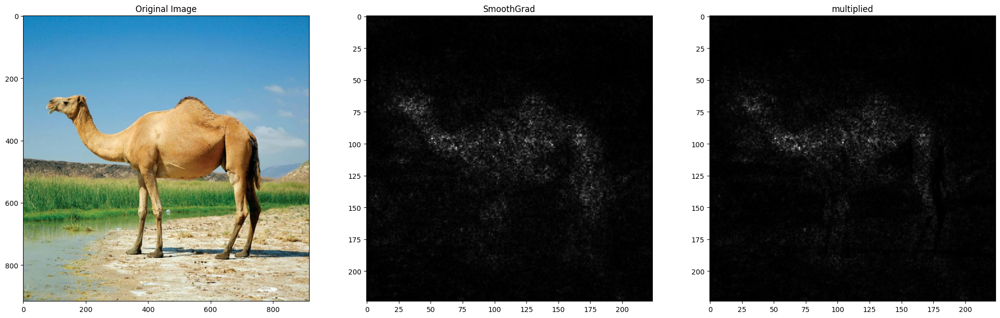

 20%|██        | 1/5 [00:03<00:14,  3.66s/it]

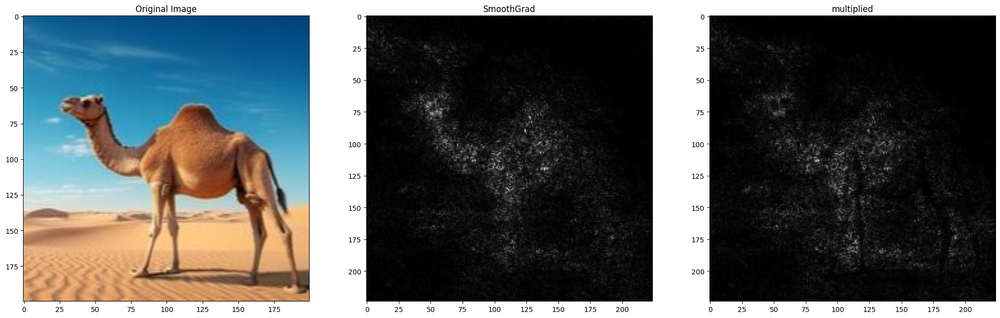

 40%|████      | 2/5 [00:08<00:12,  4.19s/it]

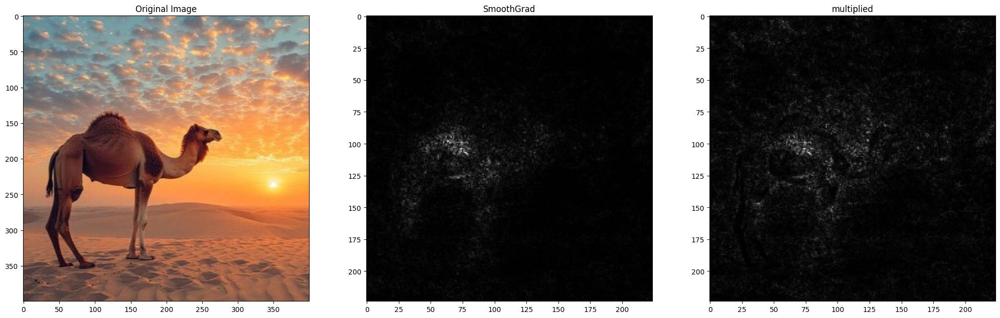

 60%|██████    | 3/5 [00:11<00:07,  3.85s/it]

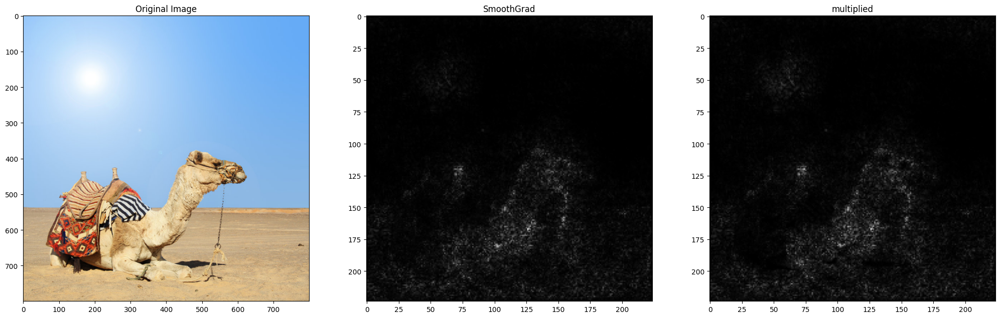

 80%|████████  | 4/5 [00:15<00:03,  3.68s/it]

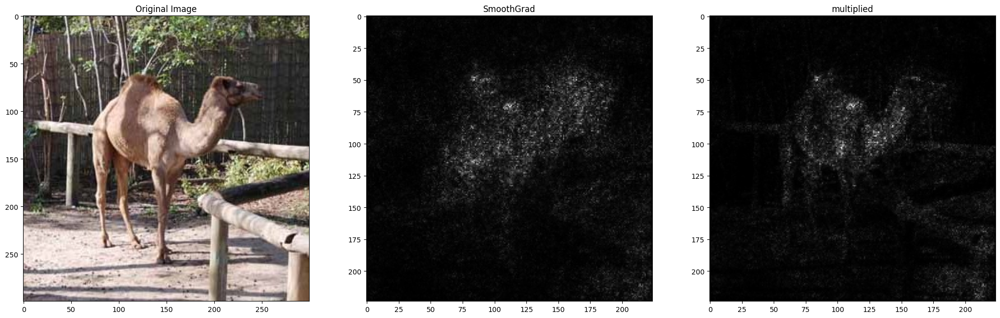

100%|██████████| 5/5 [00:18<00:00,  3.76s/it]


In [9]:
# Calculating and plotting smoothgrad for the images

for image in tqdm(images):
  # Opening the image
  img_org = Image.open(image)

  # Transforming to a tensor of required shape
  transform = transforms.Compose([
        transforms.Resize((image_dim, image_dim)),
        transforms.ToTensor()
    ])
  image = transform(img_org)
  image = image.unsqueeze(0)

  # performing smoothgrad on the image
  smooth_gradients = smoothgrad(image, n, std)

  # multiplying the smooth gradients with the original image
  multi_image = smooth_gradients*image.mean(dim=1)[0]


  plt.figure(figsize=(25, 25))
  plt.subplot(1, 3, 1)
  plt.imshow(img_org)
  plt.title("Original Image")

  plt.subplot(1, 3, 2)
  plt.imshow(smooth_gradients, cmap='gray')
  plt.title("SmoothGrad")

  plt.subplot(1, 3, 3)
  plt.imshow(multi_image, cmap='gray')
  plt.title("multiplied")
  plt.show()



### Effect of sample size

Here I vary the size of the sample to see how it affects the smooth gradient

In [10]:
sample_sizes = [10, 20, 50, 70, 100]

  0%|          | 0/5 [00:00<?, ?it/s]

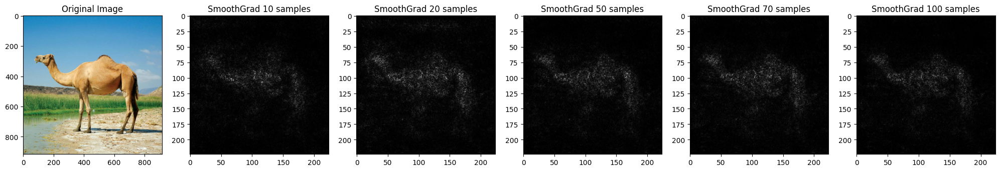

 20%|██        | 1/5 [00:14<00:59, 14.86s/it]

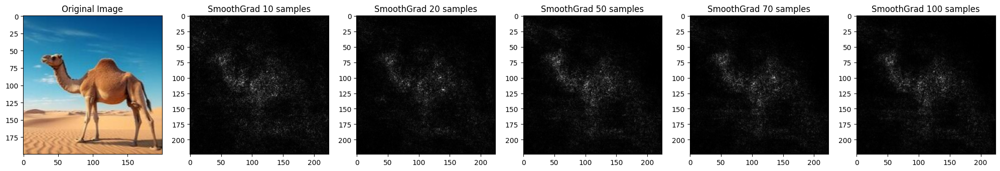

 40%|████      | 2/5 [00:28<00:43, 14.43s/it]

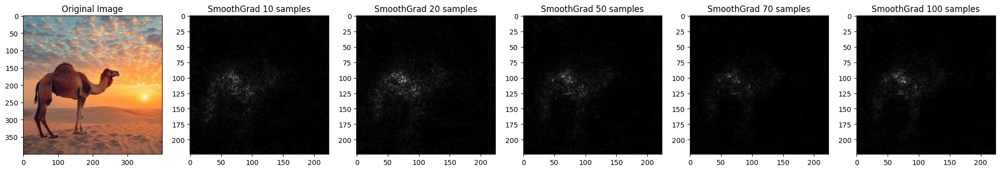

 60%|██████    | 3/5 [00:42<00:28, 14.15s/it]

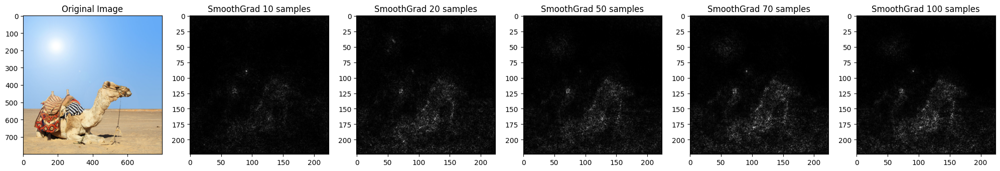

 80%|████████  | 4/5 [00:56<00:14, 14.05s/it]

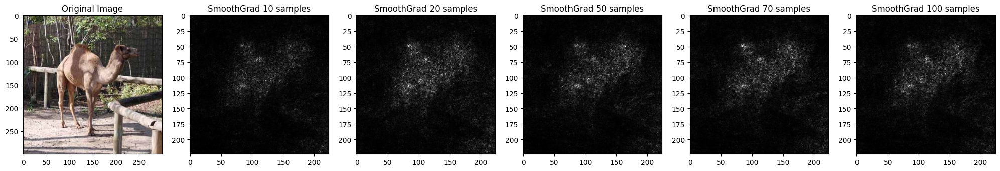

100%|██████████| 5/5 [01:10<00:00, 14.16s/it]


In [11]:
for image in tqdm(images):
  # Opening the image
  img_org = Image.open(image)

  plt.figure(figsize=(25, 25))
  plt.subplot(1, len(sample_sizes)+1, 1)
  plt.imshow(img_org)
  plt.title("Original Image")

  # Transforming to a tensor of required shape
  transform = transforms.Compose([
        transforms.Resize((image_dim, image_dim)),
        transforms.ToTensor()
    ])
  image = transform(img_org)
  image = image.unsqueeze(0)

  for n in enumerate(sample_sizes):

    # performing smoothgrad on the image
    smooth_gradients = smoothgrad(image, int(n[1]), std)

    plt.subplot(1, len(sample_sizes)+1, n[0]+2)
    plt.imshow(smooth_gradients, cmap='gray')
    plt.title(f"SmoothGrad {n[1]} samples")


  plt.show()

### Effect of standard deviation

Here I change the value of standard deviation of the gaussian sample and see its effect in the smooth gradients

  0%|          | 0/5 [00:00<?, ?it/s]

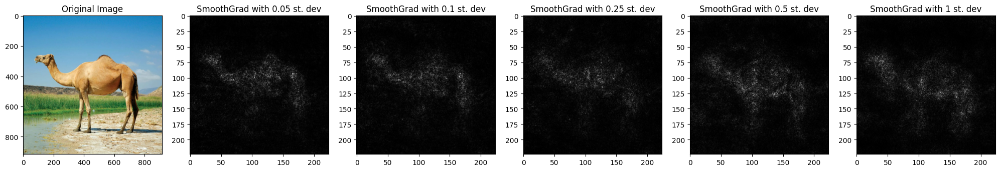

 20%|██        | 1/5 [00:14<00:59, 14.76s/it]

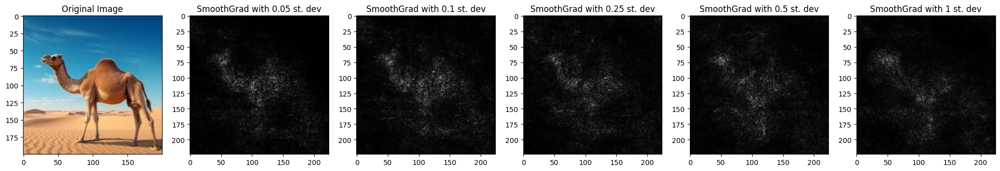

 40%|████      | 2/5 [00:29<00:43, 14.65s/it]

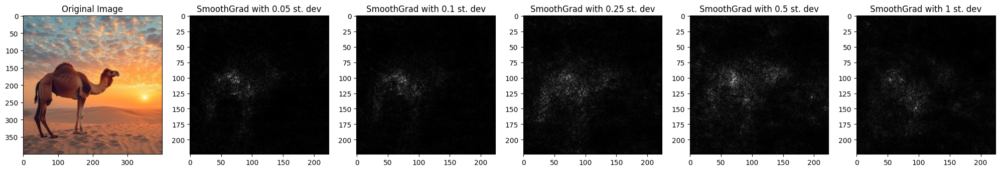

 60%|██████    | 3/5 [00:43<00:28, 14.38s/it]

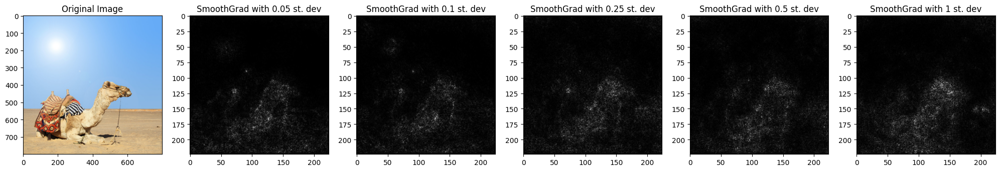

 80%|████████  | 4/5 [00:57<00:14, 14.25s/it]

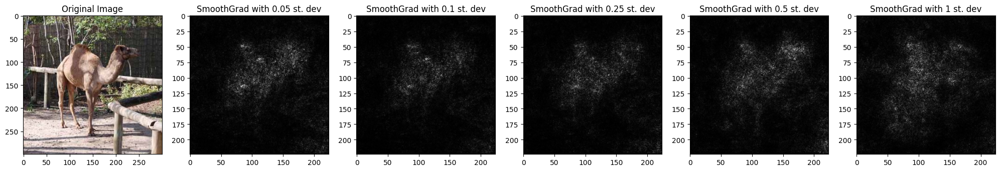

100%|██████████| 5/5 [01:11<00:00, 14.33s/it]


In [12]:
sample_size = 100
stds = [0.05, 0.1, 0.25, 0.5, 1]

for image in tqdm(images):
  # Opening the image
  img_org = Image.open(image)

  plt.figure(figsize=(25, 25))
  plt.subplot(1, len(stds)+1, 1)
  plt.imshow(img_org)
  plt.title("Original Image")

  # Transforming to a tensor of required shape
  transform = transforms.Compose([
        transforms.Resize((image_dim, image_dim)),
        transforms.ToTensor()
    ])
  image = transform(img_org)
  image = image.unsqueeze(0)

  for std in enumerate(stds):

    # performing smoothgrad on the image
    smooth_gradients = smoothgrad(image, sample_size, std[1])

    plt.subplot(1, len(stds)+1, std[0]+2)
    plt.imshow(smooth_gradients, cmap='gray')
    plt.title(f"SmoothGrad with {std[1]} st. dev")


  plt.show()